In [ ]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tqdm import tqdm

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip drive/MyDrive/data/GAN/clean-normal.zip > /dev/null

In [ ]:
path = glob.glob("./clean-normal/*.jpg")
images =[]
for file in tqdm(path):
    img = plt.imread(file)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    img = img[30:-50] / 255.
    img = img.reshape(240,240,1)
    images.append(img)
X_train = np.asarray(images)

100%|██████████| 7302/7302 [00:24<00:00, 300.85it/s]


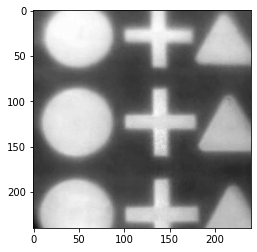

In [ ]:
plt.imshow(np.squeeze(X_train[0]) , cmap='gray')

In [ ]:
np.random.seed(42)
tf.random.set_seed(42)

In [ ]:
def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = np.squeeze(images, axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

In [ ]:
def train_gan(gan, dataset, batch_size, codings_size, n_epochs=100):
    generator, discriminator = gan.layers
    for i, epoch in enumerate(range(n_epochs)):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))
        for j,  X_batch in enumerate(tqdm(dataset)):
            X_batch = tf.cast(X_batch, tf.float32)
            # phase 1 - training the discriminator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.trainable = True
            discriminator.train_on_batch(X_fake_and_real, y1)
            if j % 10 ==0:
              print("\n\nweigts gan-disc: ")
              print(gan.layers[1].get_weights()[0][0][0])
              print("\n\nWeights disc: ")
              print(discriminator.get_weights()[0][0][0])
            # phase 2 - training the generator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            y2 = tf.constant([[1.]] * batch_size)
            discriminator.trainable = False
            gan.train_on_batch(noise, y2)
        if i % 10 == 0:
          discriminator.save("./drive/MyDrive/models/GAN/4_discriminator_{}.hdf5".format(i))
          generator.save("./drive/MyDrive/models/GAN/4_generator_{}.hdf5".format(i))
          gan.save("./drive/MyDrive/models/GAN/4_gan_{}.hdf5".format(i))
        plot_multiple_images(generated_images, 8)
        plt.show()

In [ ]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

In [ ]:
codings_size = 100

generator = keras.models.Sequential([
    keras.layers.Dense(30 * 30 * 256, input_shape=[codings_size]),
    keras.layers.Reshape([30, 30, 256]),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(128, kernel_size=5, strides=2, padding="same", activation="selu"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="same", activation="selu"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(1, kernel_size=5, strides=2, padding="same", activation="sigmoid")
])
discriminator = keras.models.Sequential([
    keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="same", activation=keras.layers.LeakyReLU(0.2), input_shape=[240, 240, 1]),
    keras.layers.Dropout(0.4),
    keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="same", activation=keras.layers.LeakyReLU(0.2)), 
    keras.layers.Dropout(0.4),
    keras.layers.Conv2D(256, kernel_size=5, strides=2, padding="same", activation=keras.layers.LeakyReLU(0.2)),
    keras.layers.Dropout(0.4),
    keras.layers.Conv2D(512, kernel_size=5, strides=2, padding="same", activation=keras.layers.LeakyReLU(0.2)),
    keras.layers.Flatten(),
    keras.layers.Dense(1, activation="sigmoid")
])
gan = keras.models.Sequential([generator, discriminator])

In [ ]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [ ]:
generator.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 230400)            23270400  
                                                                 
 reshape_3 (Reshape)         (None, 30, 30, 256)       0         
                                                                 
 batch_normalization_9 (Batc  (None, 30, 30, 256)      1024      
 hNormalization)                                                 
                                                                 
 conv2d_transpose_9 (Conv2DT  (None, 60, 60, 128)      819328    
 ranspose)                                                       
                                                                 
 batch_normalization_10 (Bat  (None, 60, 60, 128)      512       
 chNormalization)                                                
                                                      

In [ ]:
discriminator.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 120, 120, 64)      1664      
                                                                 
 dropout_9 (Dropout)         (None, 120, 120, 64)      0         
                                                                 
 conv2d_13 (Conv2D)          (None, 60, 60, 128)       204928    
                                                                 
 dropout_10 (Dropout)        (None, 60, 60, 128)       0         
                                                                 
 conv2d_14 (Conv2D)          (None, 30, 30, 256)       819456    
                                                                 
 dropout_11 (Dropout)        (None, 30, 30, 256)       0         
                                                                 
 conv2d_15 (Conv2D)          (None, 15, 15, 512)     

Epoch 1/50


100%|██████████| 228/228 [12:35<00:00,  3.31s/it]


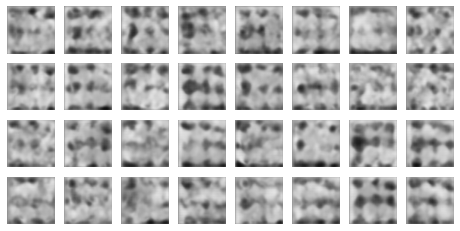

Epoch 2/50


100%|██████████| 228/228 [12:33<00:00,  3.30s/it]


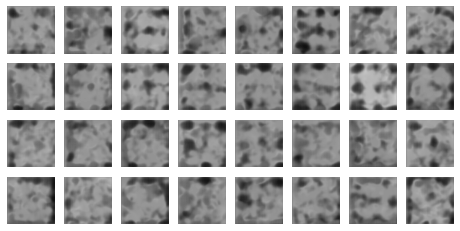

Epoch 3/50


100%|██████████| 228/228 [13:00<00:00,  3.42s/it]


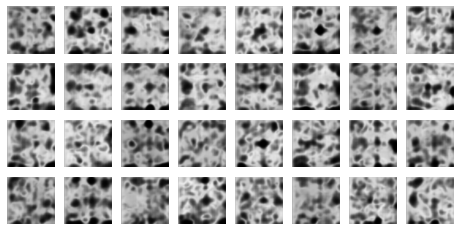

Epoch 4/50


100%|██████████| 228/228 [13:01<00:00,  3.43s/it]


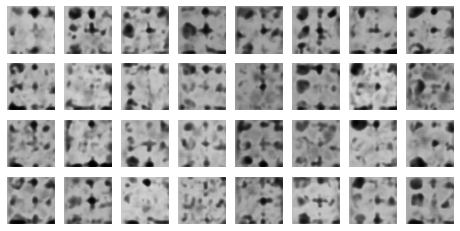

Epoch 5/50


100%|██████████| 228/228 [12:41<00:00,  3.34s/it]


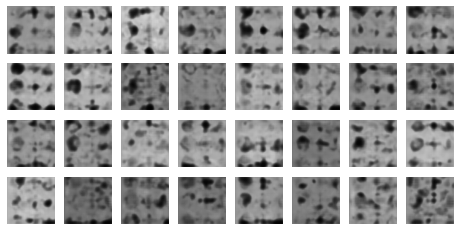

Epoch 6/50


100%|██████████| 228/228 [13:17<00:00,  3.50s/it]


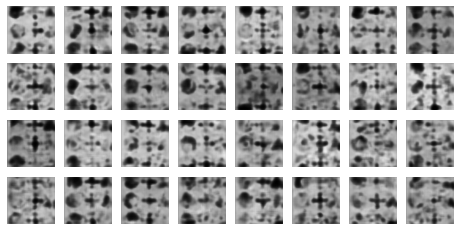

Epoch 7/50


100%|██████████| 228/228 [12:34<00:00,  3.31s/it]


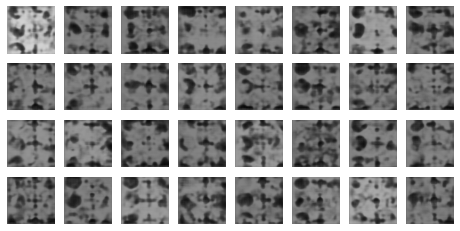

Epoch 8/50


100%|██████████| 228/228 [12:33<00:00,  3.30s/it]


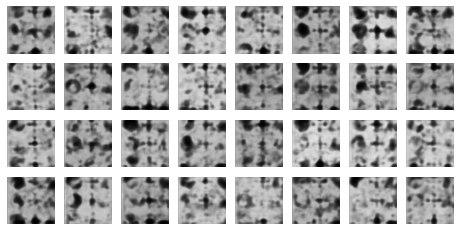

Epoch 9/50


100%|██████████| 228/228 [12:34<00:00,  3.31s/it]


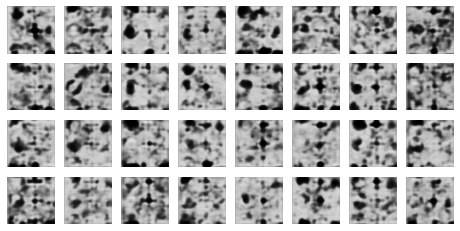

Epoch 10/50


100%|██████████| 228/228 [12:34<00:00,  3.31s/it]


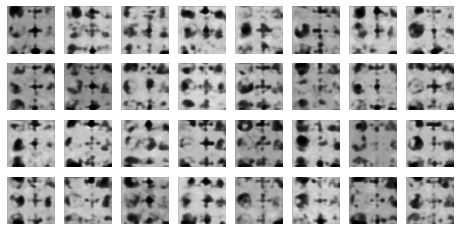

Epoch 11/50


100%|██████████| 228/228 [12:34<00:00,  3.31s/it]


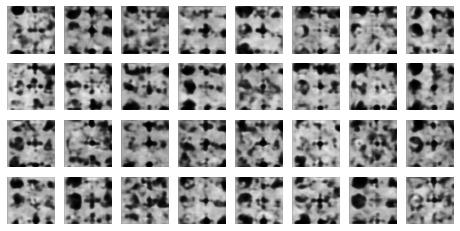

Epoch 12/50


100%|██████████| 228/228 [12:33<00:00,  3.30s/it]


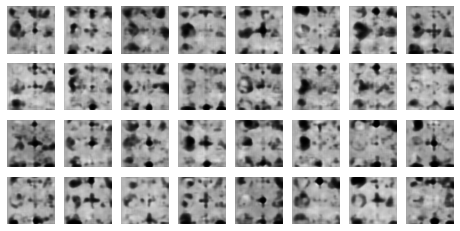

Epoch 13/50


100%|██████████| 228/228 [12:32<00:00,  3.30s/it]


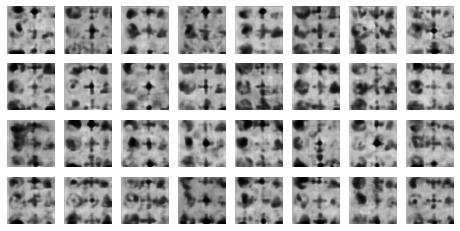

Epoch 14/50


100%|██████████| 228/228 [12:36<00:00,  3.32s/it]


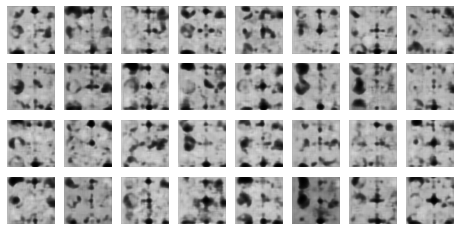

Epoch 15/50


100%|██████████| 228/228 [12:41<00:00,  3.34s/it]


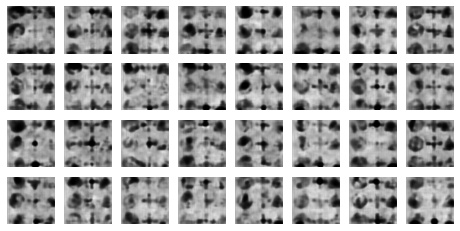

Epoch 16/50


100%|██████████| 228/228 [12:36<00:00,  3.32s/it]


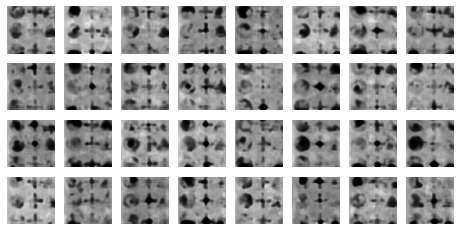

Epoch 17/50


100%|██████████| 228/228 [12:38<00:00,  3.33s/it]


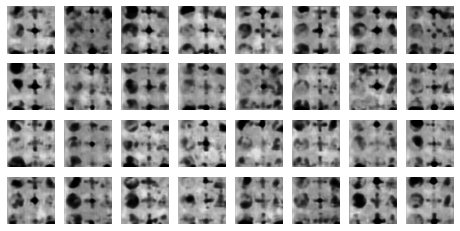

Epoch 18/50


100%|██████████| 228/228 [12:31<00:00,  3.30s/it]


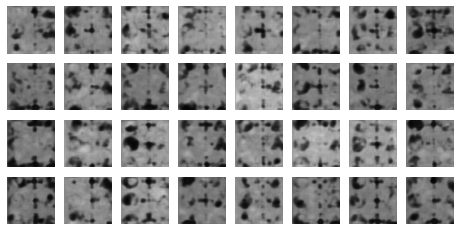

Epoch 19/50


100%|██████████| 228/228 [12:28<00:00,  3.28s/it]


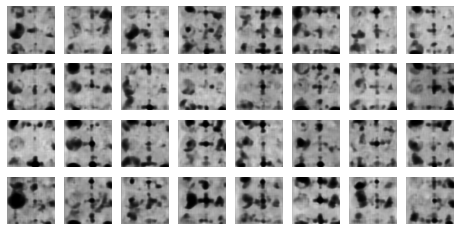

Epoch 20/50


100%|██████████| 228/228 [12:27<00:00,  3.28s/it]


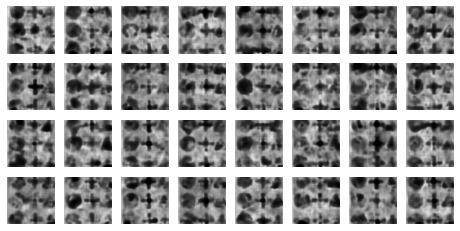

Epoch 21/50


100%|██████████| 228/228 [12:27<00:00,  3.28s/it]


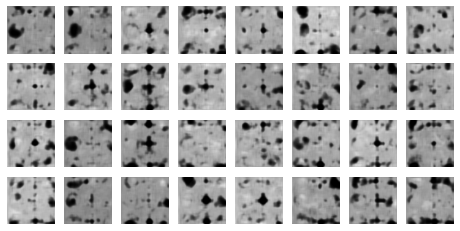

Epoch 22/50


100%|██████████| 228/228 [12:47<00:00,  3.37s/it]


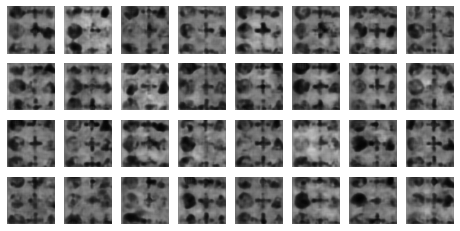

Epoch 23/50


100%|██████████| 228/228 [13:06<00:00,  3.45s/it]


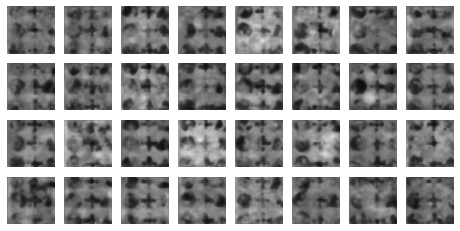

Epoch 24/50


100%|██████████| 228/228 [13:09<00:00,  3.46s/it]


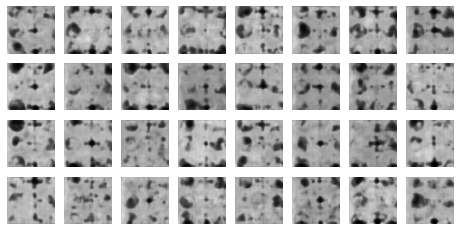

Epoch 25/50


100%|██████████| 228/228 [12:42<00:00,  3.34s/it]


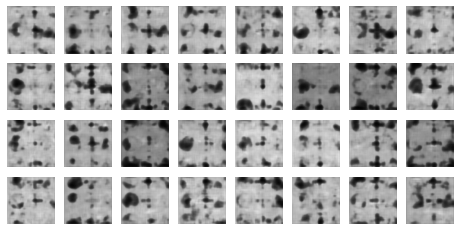

Epoch 26/50


100%|██████████| 228/228 [12:47<00:00,  3.37s/it]


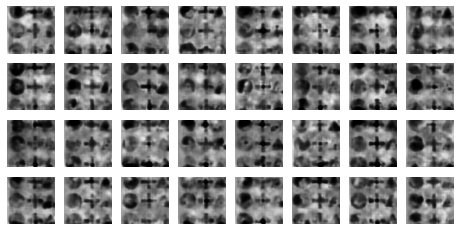

Epoch 27/50


100%|██████████| 228/228 [12:28<00:00,  3.28s/it]


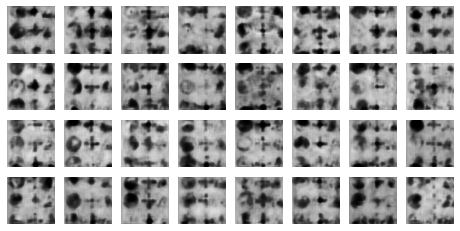

Epoch 28/50


100%|██████████| 228/228 [12:28<00:00,  3.28s/it]


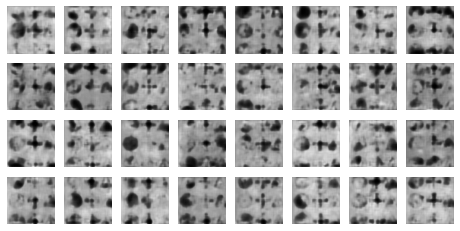

Epoch 29/50


100%|██████████| 228/228 [13:06<00:00,  3.45s/it]


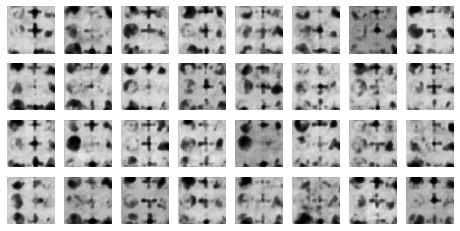

Epoch 30/50


100%|██████████| 228/228 [12:58<00:00,  3.42s/it]


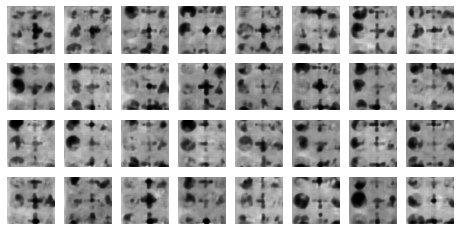

Epoch 31/50


100%|██████████| 228/228 [12:55<00:00,  3.40s/it]


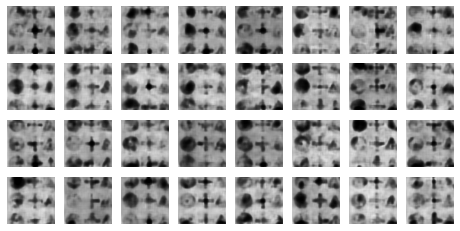

Epoch 32/50


100%|██████████| 228/228 [12:48<00:00,  3.37s/it]


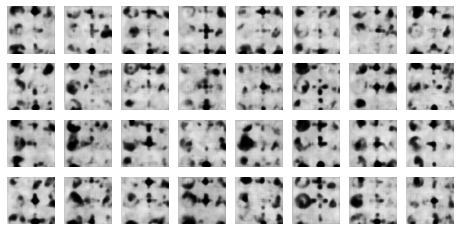

Epoch 33/50


100%|██████████| 228/228 [12:50<00:00,  3.38s/it]


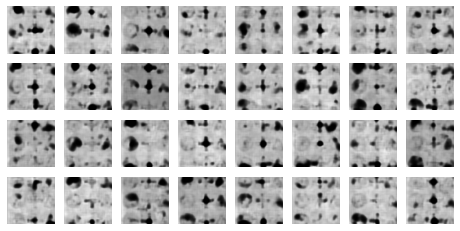

Epoch 34/50


100%|██████████| 228/228 [13:05<00:00,  3.44s/it]


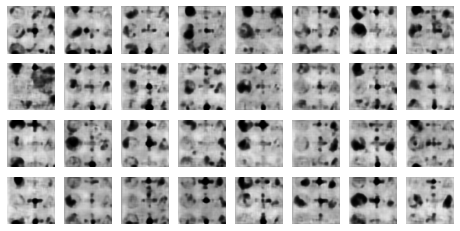

Epoch 35/50


100%|██████████| 228/228 [13:10<00:00,  3.47s/it]


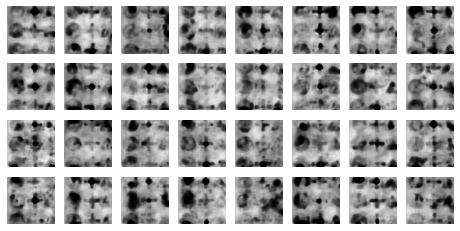

Epoch 36/50


100%|██████████| 228/228 [12:55<00:00,  3.40s/it]


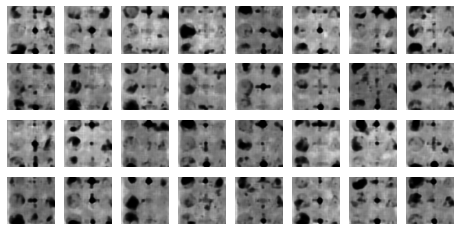

Epoch 37/50


100%|██████████| 228/228 [13:05<00:00,  3.45s/it]


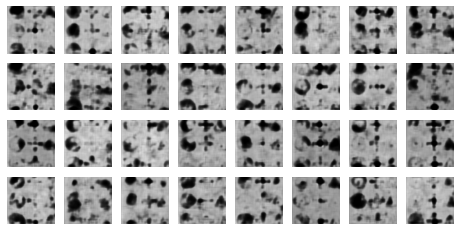

Epoch 38/50


100%|██████████| 228/228 [13:20<00:00,  3.51s/it]


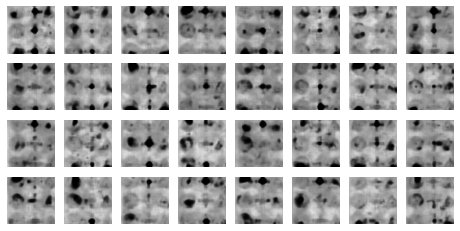

Epoch 39/50


100%|██████████| 228/228 [13:13<00:00,  3.48s/it]


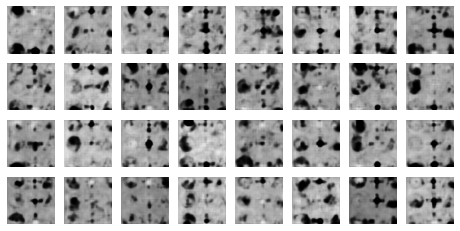

Epoch 40/50


100%|██████████| 228/228 [13:14<00:00,  3.48s/it]


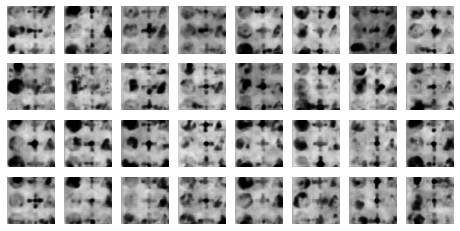

Epoch 41/50


100%|██████████| 228/228 [13:08<00:00,  3.46s/it]


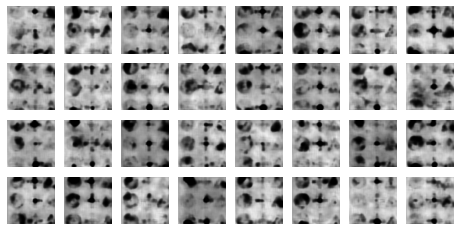

Epoch 42/50


100%|██████████| 228/228 [13:26<00:00,  3.54s/it]


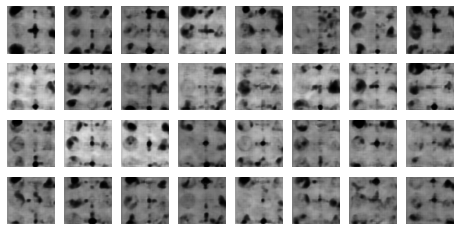

Epoch 43/50


100%|██████████| 228/228 [13:33<00:00,  3.57s/it]


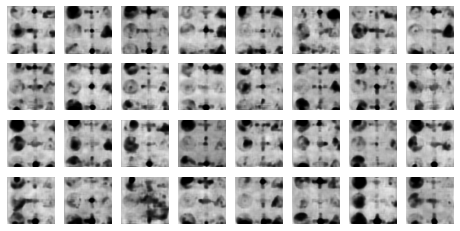

Epoch 44/50


100%|██████████| 228/228 [13:16<00:00,  3.49s/it]


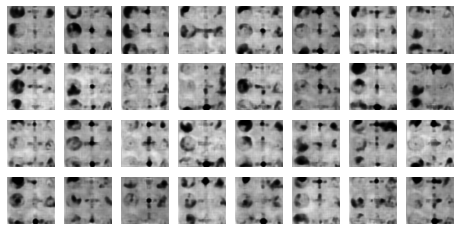

Epoch 45/50


100%|██████████| 228/228 [13:24<00:00,  3.53s/it]


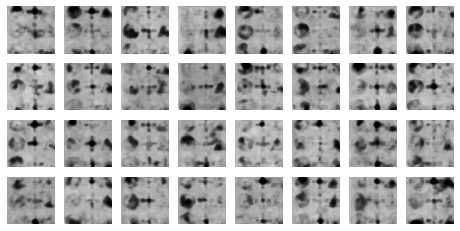

Epoch 46/50


100%|██████████| 228/228 [13:34<00:00,  3.57s/it]


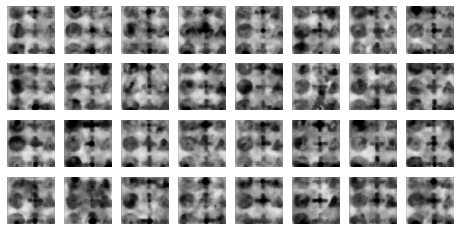

Epoch 47/50


100%|██████████| 228/228 [13:34<00:00,  3.57s/it]


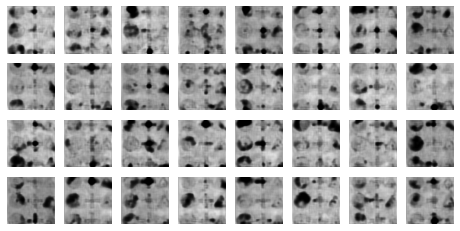

Epoch 48/50


100%|██████████| 228/228 [13:25<00:00,  3.53s/it]


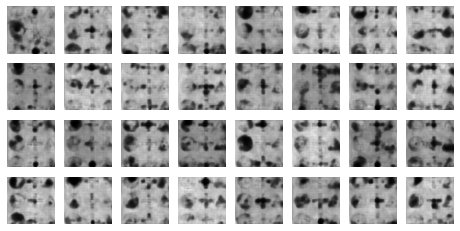

Epoch 49/50


100%|██████████| 228/228 [13:35<00:00,  3.58s/it]


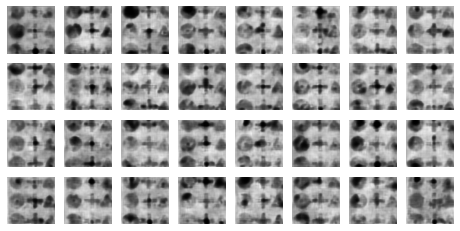

Epoch 50/50


100%|██████████| 228/228 [13:14<00:00,  3.48s/it]


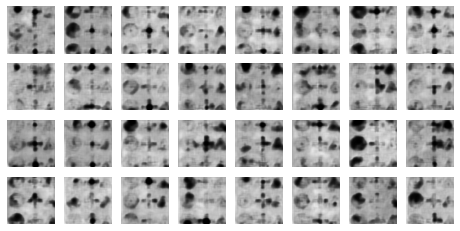

In [ ]:
train_gan(gan, dataset, batch_size, codings_size)

Epoch 1/50


100%|██████████| 228/228 [12:59<00:00,  3.42s/it]

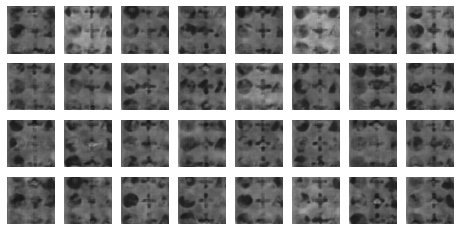

Epoch 2/50


100%|██████████| 228/228 [13:03<00:00,  3.44s/it]


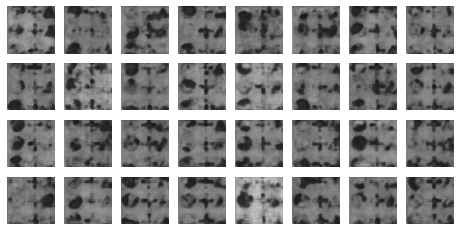

Epoch 3/50


100%|██████████| 228/228 [13:30<00:00,  3.55s/it]


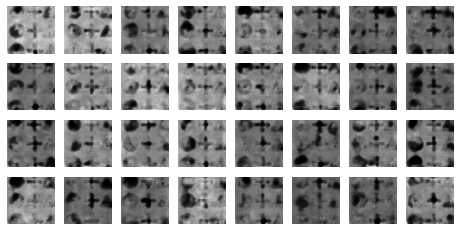

Epoch 4/50


100%|██████████| 228/228 [13:31<00:00,  3.56s/it]


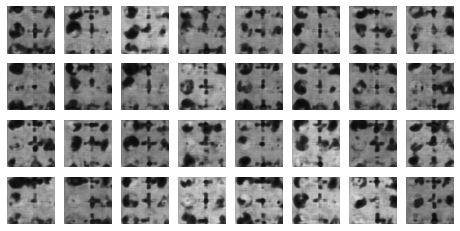

Epoch 5/50


100%|██████████| 228/228 [13:23<00:00,  3.52s/it]


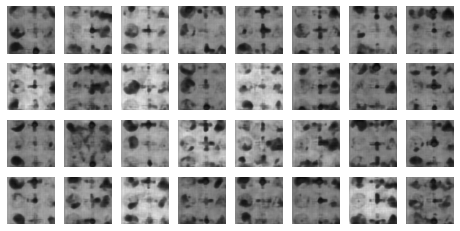

Epoch 6/50


100%|██████████| 228/228 [13:40<00:00,  3.60s/it]


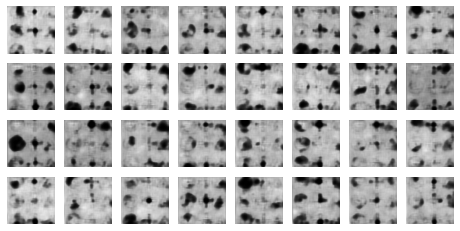

Epoch 7/50


100%|██████████| 228/228 [13:32<00:00,  3.56s/it]


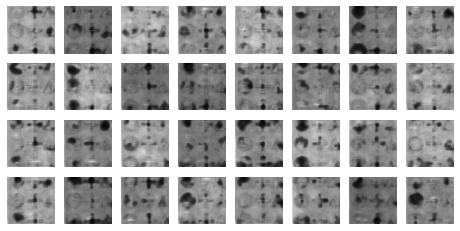

Epoch 8/50


100%|██████████| 228/228 [13:32<00:00,  3.56s/it]


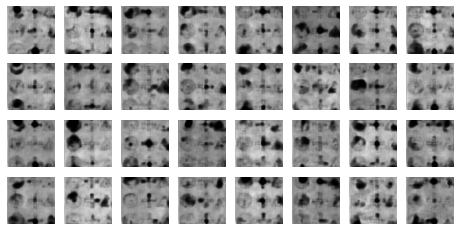

Epoch 9/50


100%|██████████| 228/228 [13:14<00:00,  3.48s/it]


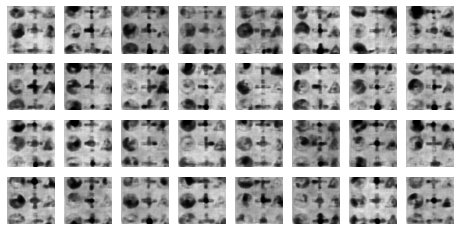

Epoch 10/50


100%|██████████| 228/228 [13:13<00:00,  3.48s/it]


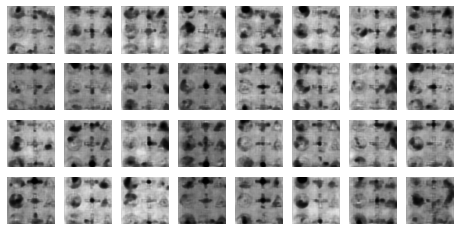

Epoch 11/50


100%|██████████| 228/228 [13:04<00:00,  3.44s/it]

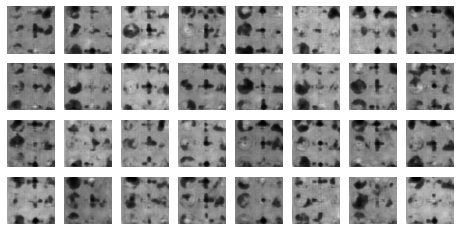

Epoch 12/50


100%|██████████| 228/228 [13:01<00:00,  3.43s/it]


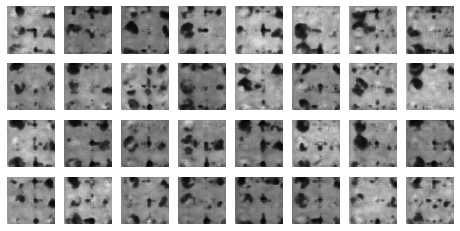

Epoch 13/50


100%|██████████| 228/228 [12:41<00:00,  3.34s/it]


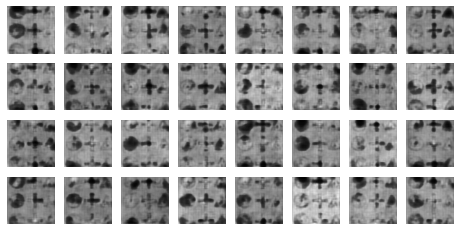

Epoch 14/50


100%|██████████| 228/228 [12:39<00:00,  3.33s/it]


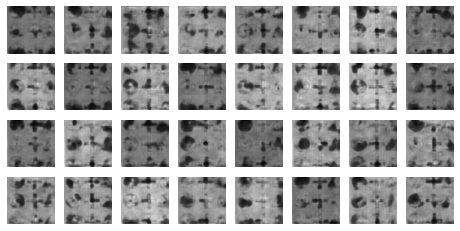

Epoch 15/50


100%|██████████| 228/228 [12:36<00:00,  3.32s/it]


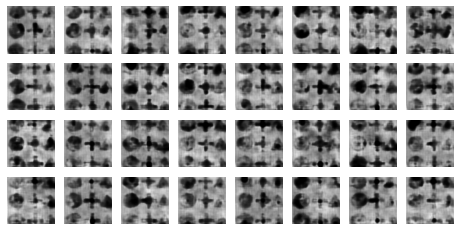

Epoch 16/50


100%|██████████| 228/228 [12:34<00:00,  3.31s/it]


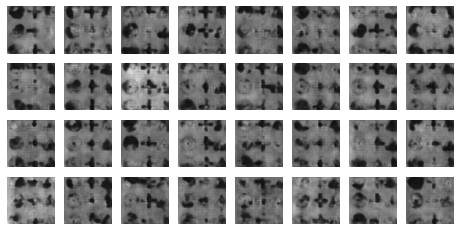

Epoch 17/50


100%|██████████| 228/228 [12:33<00:00,  3.30s/it]


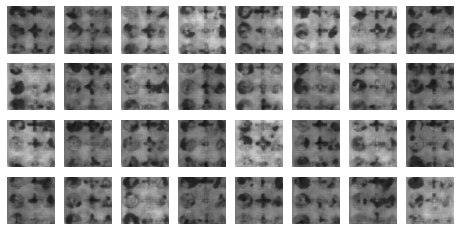

Epoch 18/50


100%|██████████| 228/228 [12:53<00:00,  3.39s/it]


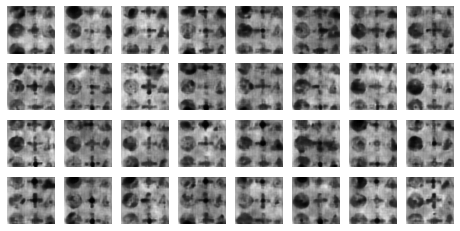

Epoch 19/50


100%|██████████| 228/228 [13:05<00:00,  3.45s/it]


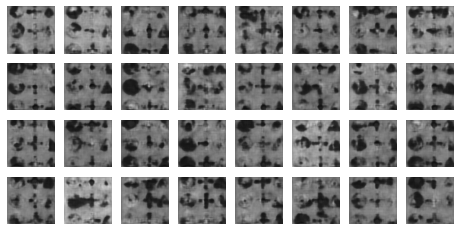

Epoch 20/50


100%|██████████| 228/228 [12:52<00:00,  3.39s/it]


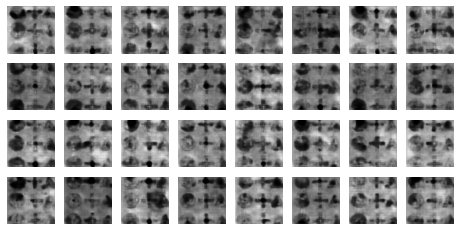

Epoch 21/50


100%|██████████| 228/228 [12:40<00:00,  3.34s/it]

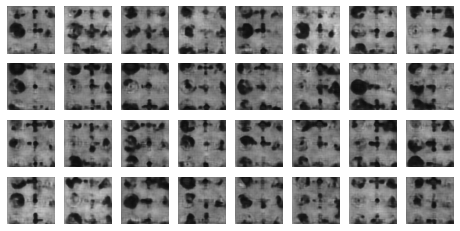

Epoch 22/50


100%|██████████| 228/228 [12:40<00:00,  3.33s/it]


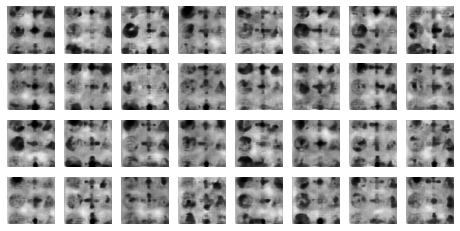

Epoch 23/50


100%|██████████| 228/228 [12:39<00:00,  3.33s/it]


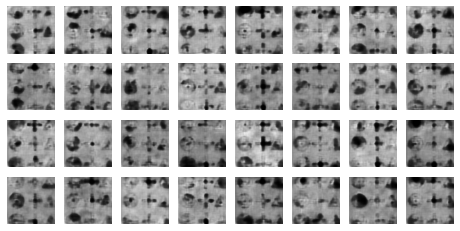

Epoch 24/50


100%|██████████| 228/228 [12:44<00:00,  3.35s/it]


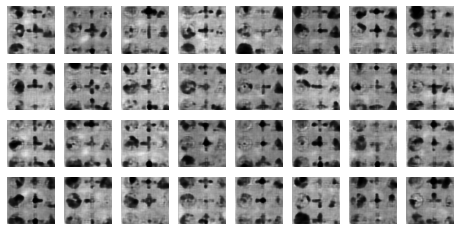

Epoch 25/50


100%|██████████| 228/228 [14:02<00:00,  3.70s/it]


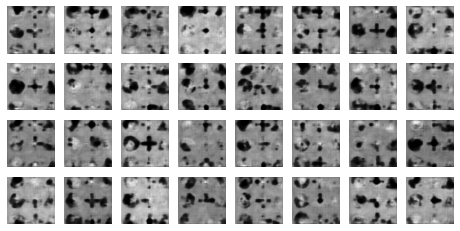

Epoch 26/50


100%|██████████| 228/228 [13:33<00:00,  3.57s/it]


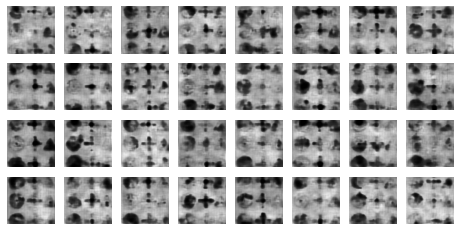

Epoch 27/50


100%|██████████| 228/228 [13:38<00:00,  3.59s/it]


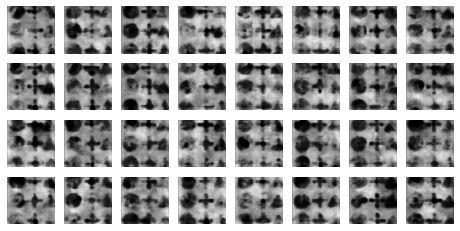

Epoch 28/50


100%|██████████| 228/228 [12:56<00:00,  3.41s/it]


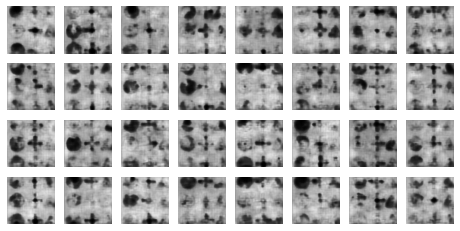

Epoch 29/50


100%|██████████| 228/228 [13:03<00:00,  3.44s/it]


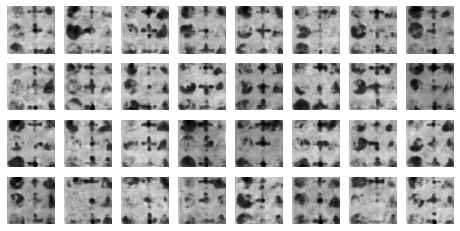

Epoch 30/50


100%|██████████| 228/228 [13:00<00:00,  3.42s/it]


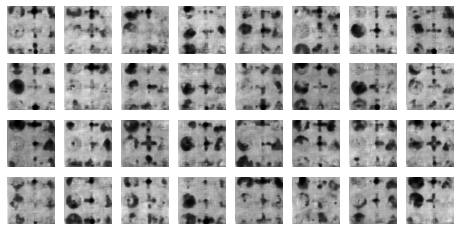

Epoch 31/50


100%|██████████| 228/228 [13:20<00:00,  3.51s/it]

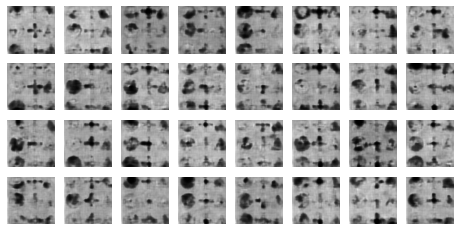

Epoch 32/50


100%|██████████| 228/228 [13:12<00:00,  3.48s/it]


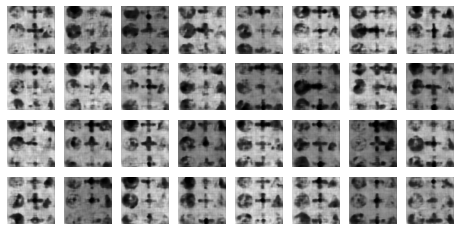

Epoch 33/50


100%|██████████| 228/228 [14:00<00:00,  3.69s/it]


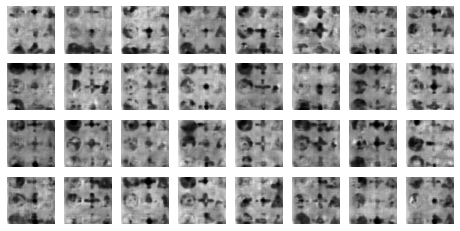

Epoch 34/50


100%|██████████| 228/228 [14:32<00:00,  3.83s/it]


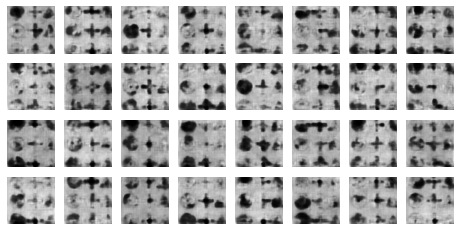

Epoch 35/50


100%|██████████| 228/228 [12:55<00:00,  3.40s/it]


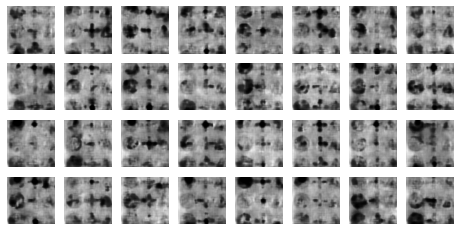

Epoch 36/50


100%|██████████| 228/228 [12:32<00:00,  3.30s/it]


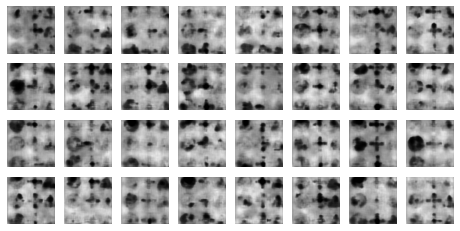

Epoch 37/50


100%|██████████| 228/228 [12:48<00:00,  3.37s/it]


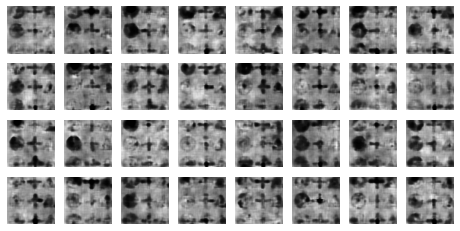

Epoch 38/50


100%|██████████| 228/228 [13:13<00:00,  3.48s/it]


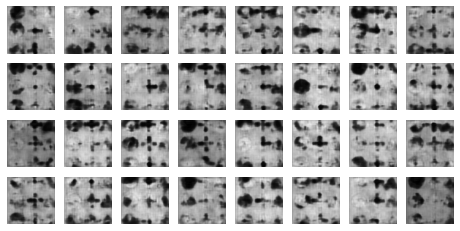

Epoch 39/50


100%|██████████| 228/228 [13:02<00:00,  3.43s/it]


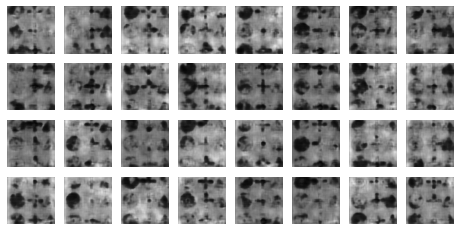

Epoch 40/50


100%|██████████| 228/228 [13:13<00:00,  3.48s/it]


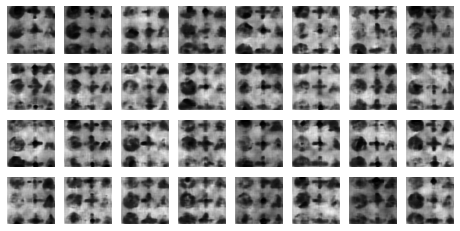

Epoch 41/50


100%|██████████| 228/228 [13:11<00:00,  3.47s/it]

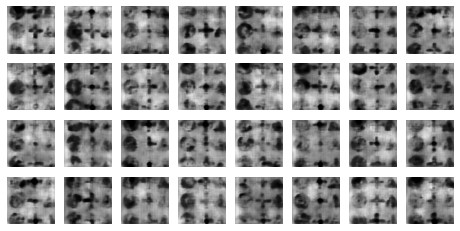

Epoch 42/50


 16%|█▌        | 36/228 [02:08<11:23,  3.56s/it]


KeyboardInterrupt: ignored

In [ ]:
train_gan(gan, dataset, batch_size, codings_size)

In [ ]:
discriminator.save("./drive/MyDrive/models/GAN/4_discriminator.hdf5")
generator.save("./drive/MyDrive/models/GAN/4_generator.hdf5")
gan.save("./drive/MyDrive/models/GAN/4_gan.hdf5")